<a href="https://colab.research.google.com/github/BinBinToure/Python/blob/main/_05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

메뉴얼 사이트 https://docs.opencv.org/

In [ ]:
import cv2

print(cv2.__version__)

4.6.0


이미지 생성

In [ ]:
import numpy as np

height = 50
width = 25
img = np.zeros((height,width,3),np.uint8)

from google.colab.patches import cv2_imshow
cv2_imshow(img)
print(img.shape)

In [ ]:
img.fill(255)
cv2_imshow(img)

이미지 로딩

In [ ]:
path = '/content/eh.jpg'
img = cv2.imread(path,cv2.IMREAD_COLOR)
cv2_imshow(img)
img = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
cv2_imshow(img)

In [ ]:
import urllib.request

def load_online_image(url):
  resp = urllib.request.urlopen(url)
  data = np.asarray(bytearray(resp.read()),dtype='uint8')
  return cv2.imdecode(data,cv2.IMREAD_COLOR)
img = load_online_image('https://t1.daumcdn.net/cfile/tistory/24704B4E56FF0C2E01')  
cv2_imshow(img)

비디오 캡쳐

In [ ]:
vf = '/content/ending.mp4'
cap = cv2.VideoCapture(vf)
cnt = 1
while True:
  ret,img = cap.read()
  if ret:
    print(cnt)
    cv2_imshow(img)
    cnt+=1
  else:
    break

웹에서 비디오 플레이 - 영상처리와 무관

In [ ]:
from IPython.display import HTML
from base64 import b64encode
vf = '/content/ending.mp4'
mp4 = open(vf,'rb').read()
data_url = 'data:video/mp4;base64,' + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
  <source src="%s" type="video/mp4">
</video>  
"""%data_url)

그리기

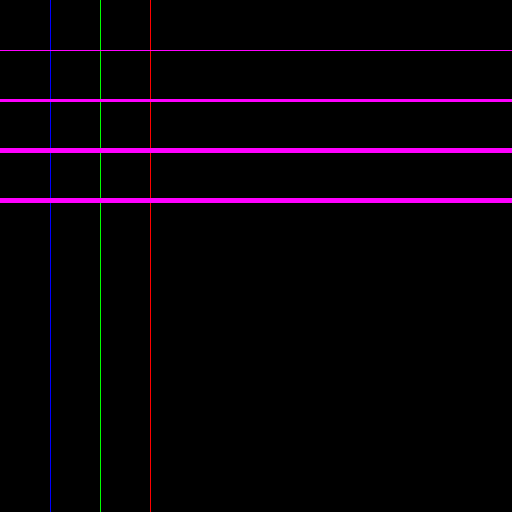

In [ ]:
#라인 그리기
import cv2
#cv.line(	img, pt1, pt2, color[, thickness[, lineType[, shift]]]	)
img = np.zeros((512,512,3),np.uint8)
#수직선 그리기 - B, G, R
cv2.line(img,(50,0),(50,512),(255,0,0)) #BLUE
cv2.line(img,(100,0),(100,512),(0,255,0)) #GREEN
cv2.line(img,(150,0),(150,512),(0,0,255)) #RED
#수직선 그리기 - 두께가 1,2,3,4
cv2.line(img,(0,50),(512,50),(255,0,255),1) #두께 1
cv2.line(img,(0,100),(512,100),(255,0,255),2) #두께 2
cv2.line(img,(0,150),(512,150),(255,0,255),3) #두께 3
cv2.line(img,(0,200),(512,200),(255,0,255),4) #두께 4

cv2_imshow(img)

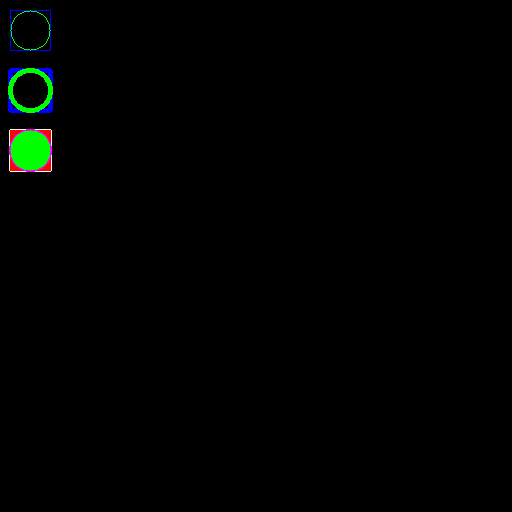

In [ ]:
#사각형 그리기
#	cv.rectangle(	img, pt1, pt2, color[, thickness[, lineType[, shift]]]	)
img = np.zeros((512,512,3),np.uint8)
cv2.rectangle(img,(10,10),(50,50),(255,0,0))
cv2.rectangle(img,(10,70),(50,110),(255,0,0),4)
cv2.rectangle(img,(10,130),(50,170),(255,255,255),2)
cv2.rectangle(img,(10,130),(50,170),(0,0,255),-1)
#원 그리기
#cv.circle(	img, center, radius, color[, thickness[, lineType[, shift]]]	)
cv2.circle(img,(30,30),20,(0,255,0))
cv2.circle(img,(30,90),20,(0,255,0),4)
cv2.circle(img,(30,150),20,(255,0,255),2)
cv2.circle(img,(30,150),20,(0,255,0),-1)
cv2_imshow(img)

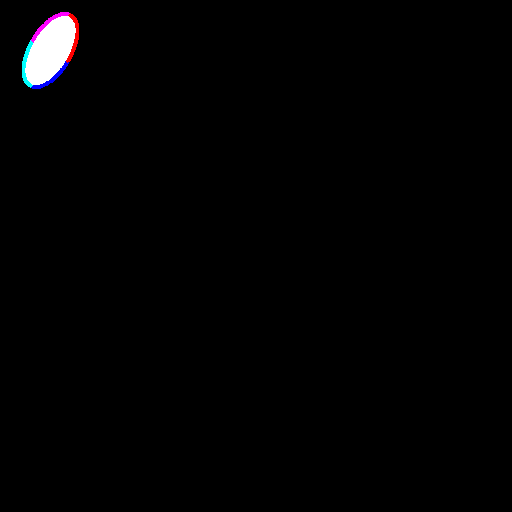

In [ ]:
#타원 그리기
#	cv.ellipse(	img, center, axes, angle, startAngle, endAngle, color[, thickness[, lineType[, shift]]]	)
img = np.zeros((512,512,3),np.uint8)
cv2.ellipse(img,(50,50),(20,40),30,0,90,(255,0,0),4)
cv2.ellipse(img,(50,50),(20,40),30,90,180,(255,255,0),4)
cv2.ellipse(img,(50,50),(20,40),30,180,270,(255,0,255),4)
cv2.ellipse(img,(50,50),(20,40),30,270,360,(0,0,255),4)
cv2.ellipse(img,(50,50),(18,38),30,0,360,(255,255,255),-1)
#cv2.rectangle(img,(30,10),(70,90),(0,255,0))
cv2_imshow(img)

In [ ]:
#다각형 그리기	
#cv.polylines(	img, pts, isClosed, color[, thickness[, lineType[, shift]]]	) 
points = np.array([[100,25],[200,25],[225,50],[175,50],[175,200],[125,200],[125,50],[75,50]])
img = np.zeros((512,512,3),np.uint8)
cv2.polylines(img,[points],True,(127,127,127),3)
#다각형 내부 채우기
#cv.fillPoly(	img, pts, color[, lineType[, shift[, offset]]]	)
cv2.fillPoly(img,[points],(127,0,175))

#글자쓰기
#cv.putText(	img, text, org, fontFace, fontScale, color[, thickness[, lineType[, bottomLeftOrigin]]]	)
cv2.putText(img,"ehpub.co.kr",(100,20),cv2.FONT_HERSHEY_SIMPLEX,0.6,(128,255,120))
cv2_imshow(img)

색상공간

In [ ]:
path1 = '/content/eh.jpg'
path2 = '/content/black_white.png'
img1 = cv2.imread(path1,cv2.IMREAD_COLOR)
img2 = cv2.imread(path2,cv2.IMREAD_COLOR)
#이미지 크기 조절
img1 = cv2.resize(img1,dsize=(320,200),interpolation=cv2.INTER_AREA)
img2 = cv2.resize(img2,dsize=(320,200),interpolation=cv2.INTER_AREA)
cv2_imshow(img1)
cv2_imshow(img2)

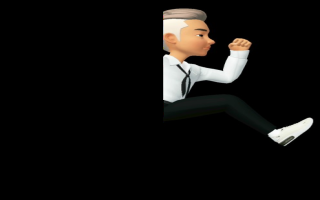

[[2 2 2]]


In [ ]:
#AND
and_img = cv2.bitwise_and(img1,img2)
cv2_imshow(and_img)
ar1 = np.array([[0x12,0x12,0x12]])
ar2 = np.array([[0x3,0x3,0x3]])
print(cv2.bitwise_and(ar1,ar2))

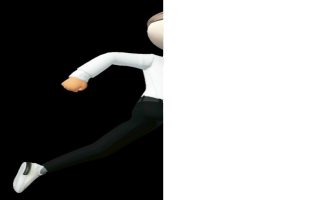

[[19 19 19]]


In [ ]:
#OR
or_img = cv2.bitwise_or(img1,img2)
cv2_imshow(or_img)
ar1 = np.array([[0x12,0x12,0x12]])
ar2 = np.array([[0x3,0x3,0x3]])
print(cv2.bitwise_or(ar1,ar2))

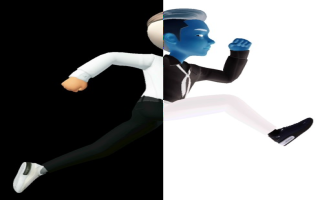

[[17 17 17]]


In [ ]:
#xor
xor_img = cv2.bitwise_xor(img1,img2)
cv2_imshow(xor_img)
ar1 = np.array([[0x12,0x12,0x12]])
ar2 = np.array([[0x3,0x3,0x3]])
print(cv2.bitwise_xor(ar1,ar2))

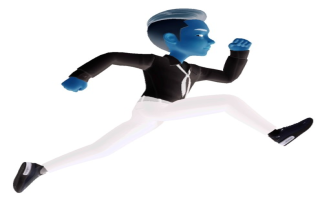

[[-19 -19 -19]]


In [ ]:
#not
not_img = cv2.bitwise_not(img1)
cv2_imshow(not_img)
ar1 = np.array([[0x12,0x12,0x12]])
print(cv2.bitwise_not(ar1))

# 색조(Hue)

0~360, 0:RED, 120:GREEN, 240:BLUE

opencv에서는 Hue/2값으로 설정(0~179까지 사용)

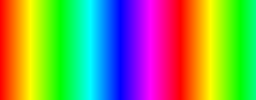

In [ ]:
img = np.zeros((100,256,3),np.uint8)
for i in range(256):
  img[:,i,0] = i #색조는 i로 표현
img[:,:,1] = 255 #채도는 MAX로 표현
img[:,:,2] = 255 #Value는 MAX로 표현
img = cv2.cvtColor(img,cv2.COLOR_HSV2BGR)
cv2_imshow(img)

# 채도(Saturation)
0에서 1사이의 값

OpenCV에서는 0에서255값으로 매핑

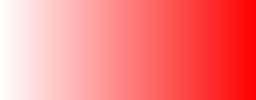

In [ ]:
img = np.zeros((100,256,3),np.uint8)
for i in range(256):
  img[:,i,1] = i #채도는 i로 표현
img[:,:,0] = 0 #색조는 0(RED)
img[:,:,2] = 255 #Value는 MAX로 표현
img = cv2.cvtColor(img,cv2.COLOR_HSV2BGR)
cv2_imshow(img)

# Value

0에서 1사이의 값

OpenCV에서는 0에서255값으로 매핑

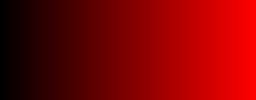

In [ ]:
img = np.zeros((100,256,3),np.uint8)
for i in range(256):
  img[:,i,2] = i #Value는 i로 표현
img[:,:,0] = 0 #색조는 0(RED)
img[:,:,1] = 255 #채도는 MAX로 표현
img = cv2.cvtColor(img,cv2.COLOR_HSV2BGR)
cv2_imshow(img)

색상공간변형한 후에 원하는 영역 추출해 보기

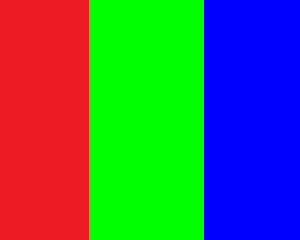

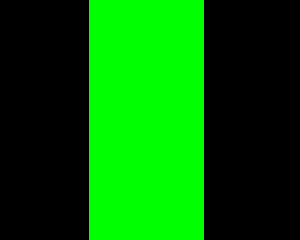

In [ ]:
path = '/content/rgb.png'
img = cv2.imread(path,cv2.IMREAD_COLOR)
img = cv2.resize(img,dsize=(300,240))
cv2_imshow(img)

#STEP1 - 색상 공간을 HSV로 변형한다.
hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
h_green = cv2.inRange(hsv,(59,0,0),(61,255,255)) #색조값이 59~61 사이를 추출하기 위한 filter
d_green = cv2.bitwise_and(img,img,mask=h_green)
cv2_imshow(d_green)

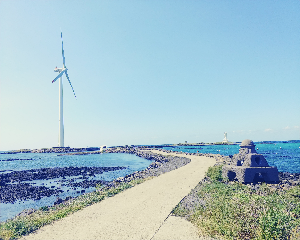

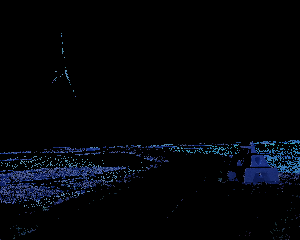

In [ ]:
path='/content/sinchang.jpg'
img = cv2.imread(path,cv2.IMREAD_COLOR)
img = cv2.resize(img,dsize=(300,240))

#STEP1 = 색상 공간 변형
hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
#STP2 = 원하는 영역 Filter
h_filter = cv2.inRange(hsv,(90,100,0),(140,255,190))
d_img = cv2.bitwise_and(img,img,mask=h_filter)
cv2_imshow(img)
cv2_imshow(d_img)

기본 영상 처리

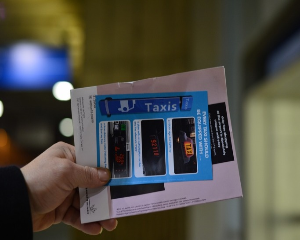

In [ ]:
path = '/content/ticket.jpg'
img = cv2.imread(path,cv2.IMREAD_COLOR)
img = cv2.resize(img,dsize=(300,240))
cv2_imshow(img)

In [ ]:
#이진화
#	cv.threshold(	src, thresh, maxval, type[, dst]	)
_,th_img = cv2.threshold(img,127,255,cv2.THRESH_BINARY) #이진화
mimg = cv2.hconcat([img,th_img])
cv2_imshow(mimg)

In [ ]:
gimg = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY) #흑백으로 전환
_,th_img = cv2.threshold(gimg,127,255,cv2.THRESH_BINARY) #이진화
mimg = cv2.hconcat([gimg,th_img])
cv2_imshow(mimg)

In [ ]:
_,th_img = cv2.threshold(gimg,127,255,cv2.THRESH_BINARY_INV) #이진화(역)
mimg = cv2.hconcat([gimg,th_img])
cv2_imshow(mimg)

In [ ]:
_,th_img = cv2.threshold(gimg,127,255,cv2.THRESH_TRUNC) #이진화(TRUNC)127이상은 127로 127미만은 변화없음
mimg = cv2.hconcat([gimg,th_img])
cv2_imshow(mimg)

In [ ]:
_,th_img = cv2.threshold(gimg,127,255,cv2.THRESH_TOZERO) #이진화(Zero))127이상은 변화없음 127미만은 0으로
mimg = cv2.hconcat([gimg,th_img])
cv2_imshow(mimg)

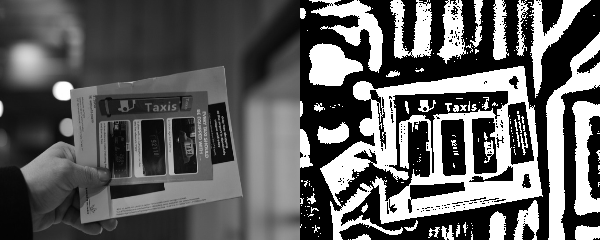

In [ ]:
#주변 환경(평균)을 고려하여 이진화
#cv.adaptiveThreshold(	src, maxValue, adaptiveMethod, thresholdType, blockSize, C[, dst]	) 
th_img = cv2.adaptiveThreshold(gimg,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,23,0)
mimg = cv2.hconcat([gimg,th_img])
cv2_imshow(mimg)

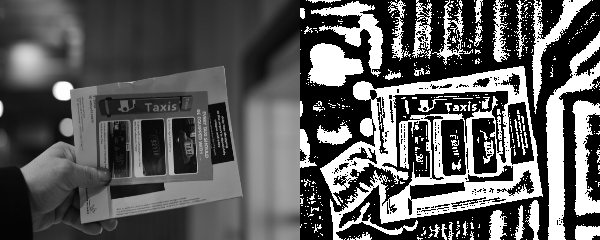

In [ ]:
#주변 환경(미분)을 고려하여 이진화
#cv.adaptiveThreshold(	src, maxValue, adaptiveMethod, thresholdType, blockSize, C[, dst]	) 
th_img = cv2.adaptiveThreshold(gimg,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,23,0)
mimg = cv2.hconcat([gimg,th_img])
cv2_imshow(mimg)

이미지 처리 기초

In [ ]:
path = '/content/sinchang.jpg'
src_img = cv2.imread(path,cv2.IMREAD_COLOR)
cv2_imshow(src_img)

In [ ]:
#크기 조절
dst_img1 = cv2.resize(src_img,dsize=(300,200),interpolation=cv2.INTER_AREA) #축소할 때 많이 사용
cv2_imshow(dst_img1)
#선형보간법2X2
dst_img2 = cv2.resize(src_img,dsize=(300,200),interpolation=cv2.INTER_LINEAR)
cv2_imshow(dst_img2)
#선형보간법4X4
dst_img3 = cv2.resize(src_img,dsize=(300,200),interpolation=cv2.INTER_CUBIC)
cv2_imshow(dst_img3)
#선형보간법8X8
dst_img4 = cv2.resize(src_img,dsize=(300,200),interpolation=cv2.INTER_LANCZOS4)
cv2_imshow(dst_img4)

In [ ]:
#크기 조절
dst_img5 = cv2.resize(dst_img1,dsize=(600,400),interpolation=cv2.INTER_AREA)
cv2_imshow(dst_img5)
#선형보간법2X2
dst_img6 = cv2.resize(dst_img1,dsize=(600,400),interpolation=cv2.INTER_LINEAR)#확대할 때 사용
cv2_imshow(dst_img6)
#선형보간법4X4
dst_img7 = cv2.resize(dst_img1,dsize=(600,400),interpolation=cv2.INTER_CUBIC)#확대할 때 사용
cv2_imshow(dst_img7)
#선형보간법8X8
dst_img8 = cv2.resize(dst_img1,dsize=(600,400),interpolation=cv2.INTER_LANCZOS4)#확대할 때 사용
cv2_imshow(dst_img8)

In [ ]:
#피라미드 확대
#cv.pyrUp(	src[, dst[, dstsize[, borderType]]]	) 
dst_img1 = cv2.resize(src_img,dsize=(120,100),interpolation=cv2.INTER_AREA)
cv2_imshow(dst_img1)
u_image = cv2.pyrUp(dst_img1)
cv2_imshow(u_image)
u_image = cv2.pyrUp(u_image)
cv2_imshow(u_image)
u_image = cv2.pyrUp(u_image)
cv2_imshow(u_image)

In [ ]:
#피라미드 축소
#cv.pyrDown(	src[, dst[, dstsize[, borderType]]]	) 
dst_img1 = cv2.resize(src_img,dsize=(120,100),interpolation=cv2.INTER_AREA)
cv2_imshow(dst_img1)
u_image = cv2.pyrDown(dst_img1)
cv2_imshow(u_image)
u_image = cv2.pyrDown(u_image)
cv2_imshow(u_image)
u_image = cv2.pyrDown(u_image)
cv2_imshow(u_image)

In [ ]:
#이미지 대칭
dst_img = cv2.resize(src_img,dsize=(240,200),interpolation=cv2.INTER_AREA)
cv2_imshow(dst_img)
#cv.flip(	src, flipCode[, dst]	)
f_img1 = cv2.flip(dst_img,flipCode=0) #상하
cv2_imshow(f_img1)
f_img1 = cv2.flip(dst_img,flipCode=1) #좌우
cv2_imshow(f_img1)
f_img1 = cv2.flip(dst_img,flipCode=-1) #상하좌우
cv2_imshow(f_img1)

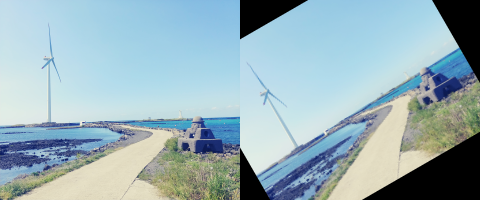

In [ ]:
#이미지 회전
#cv.getRotationMatrix2D(	center, angle, scale	)
center = (dst_img.shape[0]/2,dst_img.shape[1]/2 ) #중심점(이미지의 센터로)
matrix = cv2.getRotationMatrix2D(center,30,1) #중심점에서 30도 회전, 크기는 1배
r_img = cv2.warpAffine(dst_img,matrix,(0,0))#Affine 연산
m_img = cv2.hconcat([dst_img,r_img])#이미지 합병
cv2_imshow(m_img)

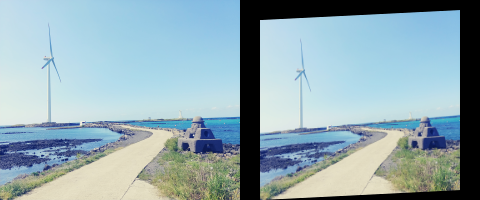

In [ ]:
#세 점을 이용하여 이미지 변환(아핀 변환)
#cv.getAffineTransform(	src, dst	) 
pts_src = np.float32([[0,0],[0,200],[240,0]])
pts_dst = np.float32([[20,20],[20,200],[220,10]])
matrix = cv2.getAffineTransform(pts_src,pts_dst) 
r_img = cv2.warpAffine(dst_img,matrix,(0,0))#Affine 연산
m_img = cv2.hconcat([dst_img,r_img])#이미지 합병
cv2_imshow(m_img)

In [ ]:
#네 점을 이용하여 이미지 변환(원근 변환)
#cv.getPerspectiveTransform(	src, dst	) 
pts_src = np.float32([[0,0],[0,200],[240,0],[240,200]])
pts_dst = np.float32([[20,20],[20,180],[240,0],[240,200]])
matrix = cv2.getPerspectiveTransform(pts_src,pts_dst) 
r_img = cv2.warpPerspective(dst_img,matrix,(0,0))#Affine 연산
m_img = cv2.hconcat([dst_img,r_img])#이미지 합병
cv2_imshow(m_img)

팽창 및 침식 및 모폴로지 등의 효과는 자습

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
kernel

array([[0, 1, 0],
       [1, 1, 1],
       [0, 1, 0]], dtype=uint8)

In [ ]:
#팽창
#cv.dilate(	src, kernel[, dst[, anchor[, iterations[, borderType[, borderValue]]]]]	)
path = '/content/sinchang.jpg'
src_img = cv2.imread(path,cv2.IMREAD_COLOR)
img = cv2.resize(src_img,dsize=(240,200),interpolation=cv2.INTER_AREA)
cv2_imshow(img)

for ks in range(1,10,2):
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(ks,ks))
  dil_img = cv2.dilate(img,kernel)
  cv2_imshow(dil_img)

In [ ]:
#침식
#cv.erode(	src, kernel[, dst[, anchor[, iterations[, borderType[, borderValue]]]]]	) 
path = '/content/sinchang.jpg'
src_img = cv2.imread(path,cv2.IMREAD_COLOR)
img = cv2.resize(src_img,dsize=(240,200),interpolation=cv2.INTER_AREA)
cv2_imshow(img)

for ks in range(1,10,2):
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(ks,ks))
  e_img = cv2.erode(img,kernel)
  cv2_imshow(e_img)

In [ ]:
#cv.morphologyEx(	src, op, kernel[, dst[, anchor[, iterations[, borderType[, borderValue]]]]]	)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(9,9))
#열기 : dil(ero)
o_img = cv2.morphologyEx(img,cv2.MORPH_OPEN,kernel)
cv2_imshow(o_img)
#닫기 : ero(dil)
o_img = cv2.morphologyEx(img,cv2.MORPH_CLOSE,kernel)
cv2_imshow(o_img)
#탑햇 : src - open
o_img = cv2.morphologyEx(img,cv2.MORPH_TOPHAT,kernel)
cv2_imshow(o_img)
#블랙햇 : close - src
o_img = cv2.morphologyEx(img,cv2.MORPH_BLACKHAT,kernel)
cv2_imshow(o_img)
#GRADIENT : dil - ero
o_img = cv2.morphologyEx(img,cv2.MORPH_GRADIENT,kernel)
cv2_imshow(o_img)

원하는 영역 검출

In [ ]:
path = '/content/Number.PNG'
img = cv2.imread(path,cv2.IMREAD_COLOR)
cv2_imshow(img)

In [ ]:
#step1 원본 이미지를 복사
cpy_img = img.copy()
cv2_imshow(cpy_img)

In [ ]:
#setp2 흑백 이미지로 색상 공간 변환
gray_img = cv2.cvtColor(cpy_img,cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_img)

In [ ]:
#칼라 이미지와 흑백 이미지 구조 비교
print(cpy_img.shape, gray_img.shape)

In [ ]:
#setp3 Blur 처리
#cv.GaussianBlur(	src, ksize, sigmaX[, dst[, sigmaY[, borderType]]]	)
blur_img = cv2.GaussianBlur(gray_img,(5,5),0)
cv2_imshow(blur_img)

In [ ]:
#setp4 캐니 효과
#cv.Canny(	image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]]	) -
canny_img = cv2.Canny(blur_img,0,127)
cv2_imshow(canny_img)

In [ ]:
#setp5 경계(Contour) 검출
#cv.findContours(	image, mode, method[, contours[, hierarchy[, offset]]]	)
contours, _ = cv2.findContours(canny_img,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
print(len(contours))

27


In [ ]:
#setp6 각 경계를 포함하는 최소 사각 영역 확인
#cv.boundingRect(	array	)
xywhs=[]
for contour in contours:
  x,y,w,h = cv2.boundingRect(contour)
  flag = False #존재
  if w>=30 and h>=40:
    for sxywh in xywhs:
      gx = abs(sxywh[0]-x)
      gy = abs(sxywh[1]-y)
      if gx<10 and gy<10: #인접한 게 이미 있다면
        flag = True
        break
    if flag == False: #처음 발견했을 때(인접한 것 없음)
      xywhs.append([x,y,w,h])

10


In [ ]:
#step7 - 사각 영역으로 마킹

In [ ]:
for xywh in xywhs:
  x,y,w,h = xywh
  cv2.rectangle(img,(x-5,y-5),(x+w+10,y+h+10),(0,0,255),1)
cv2_imshow(img)

In [ ]:
face_xml = '/content/haarcascade_frontalface_default.xml'
face_cascade = cv2.CascadeClassifier(face_xml)

img = cv2.imread('/content/d2.png')
g_img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(g_img)
for face in faces:
  x,y,w,h = face
  cv2.rectangle(img,(x-5,y-5),(x+w+10,y+h+10),(0,0,255),1)
cv2_imshow(img)